In [1]:
#%matplotlib inline
import argparse
import os
import glob
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.datasets
from torchvision import transforms, datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 123
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  123


### Loading Data
- We need roughly 75k-100k images to get the GAN working. We can add the image sets we have to gether for roughly 3k images. We need to generate more using augmentation in Pytorch
- To do this we'll use (1) Custom Dataset class and (2) image transforms from pytorch

In [2]:
def get_paths(base_path='/kaggle/input/pokedex-dataset/pokedex-dataset/images/'):
    # Go through all sub folders in an /images/ directory
    paths = os.listdir(base_path)

    # Loop over each path
    for path in paths:
        full_path = os.path.join(base_path, path)

        # Check if the path is a directory
        if os.path.isdir(full_path):
            print(f"Found directory: {full_path}")
        else:
            print(f"Found file: {full_path}")
    # Construct the pattern to search for "main-sprites" directories
    pattern = os.path.join(base_path, "**/main-sprites")

    # Use glob to find directories matching the pattern
    main_sprites_directories = glob.glob(pattern, recursive=True)

    return main_sprites_directories

In [5]:
# Set the device to run on, GPU if possible
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_device(device)
print(f'Device used = {device}')

Device used = cpu


/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


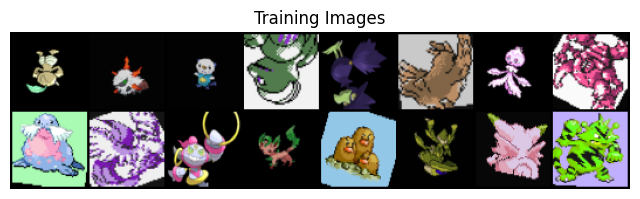

In [25]:
class CustomAugmentedDataset(Dataset):
    def __init__(self, root_dir, num_augmentations=1, transform=None):
        self.dataset = datasets.ImageFolder(root_dir)
        self.num_augmentations = num_augmentations
        self.transform = transform

    def __len__(self):
        return len(self.dataset) * self.num_augmentations

    def __getitem__(self, index):
        original_index = index % len(self.dataset)
        original_image, _ = self.dataset[original_index]
        
        augmented_images = []

        for _ in range(self.num_augmentations):
            augmented_image = self.transform(original_image) if self.transform else original_image
            augmented_images.append(augmented_image)

        return augmented_images
    
    def get_paths(self, root_dir='/kaggle/input/pokedex-dataset/pokedex-dataset/images/'):
        # Go through all sub folders in an /images/ directory
        paths = os.listdir(root_dir)

        # Loop over each path
        for path in paths:
            full_path = os.path.join(root_dir, path)

            # Check if the path is a directory
            if os.path.isdir(full_path):
                print(f"Found directory: {full_path}")
            else:
                print(f"Found file: {full_path}")
        # Construct the pattern to search for "main-sprites" directories
        pattern = os.path.join(root_dir, "**/main-sprites")

        # Use glob to find directories matching the pattern
        img_directories = glob.glob(pattern, recursive=True)

        return img_directories


# Root directory for dataset. Note that this folder should contain folder(s) with classes of objects
root_directory = '/kaggle/input/pokedex-dataset/pokedex-dataset/images/'

# Define augmentation transforms
augmentation_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(degrees=30),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.RandomResizedCrop(size=(64, 64), scale=(0.8, 1.0)),
    transforms.ToTensor(),
])

# Create a custom augmented dataset
num_augmentations = 5  # Specify the number of augmented versions for each image
custom_dataset = CustomAugmentedDataset(root_dir=root_directory,
                                        num_augmentations=num_augmentations, 
                                        transform=augmentation_transform)

# Create a dataloader
batch_size = 64
dataloader = DataLoader(custom_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:16], padding=2, normalize=True).cpu(),(1,2,0)))

In [26]:
len(dataloader.dataset)

93210

### Defining Model/Training Parameters

In [30]:
#workers = 2 # Number of workers for dataloader
#batch_size = 128 # Batch size during training
image_size = 64 # size to resize all input images
nc = 3 # color channels
nz = 100 # Size of generator input z
ngf = 64 # Size of feature maps in generator
ndf = 64 # Size of feature maps in discriminator
num_epochs = 5
lr = 0.0002 # Learning rate for optimizers
beta1 = 0.5 # Beta1 hyperparameter for Adam optimizer
ngpu = 1 # Number of GPUs available. Use 0 for CPU mode.

In [20]:
# Set the device to run on, GPU if possible
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_device(device)
print(f'Device used = {device}')

Device used = cpu


In [29]:
# Create dataset object passing path and a transform to resize the images
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, 
                                         batch_size=batch_size,
                                         shuffle=True, 
                                         num_workers=workers)


# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:16], padding=2, normalize=True).cpu(),(1,2,0)))

NameError: name 'dset' is not defined

In [56]:
# Example of initializing and normalizing pytorch tensors
w = torch.empty(3, 5)
print(nn.init.normal_(w, mean=1, std=0.1))

tensor([[0.9630, 0.9760, 0.8803, 1.0209, 0.9028],
        [0.9245, 1.0324, 0.9891, 1.0210, 0.9609],
        [1.0235, 1.0665, 1.0353, 1.0973, 0.9961]])


In [27]:
# Custom weight initializer to give normal dist of weights to different types of layers
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

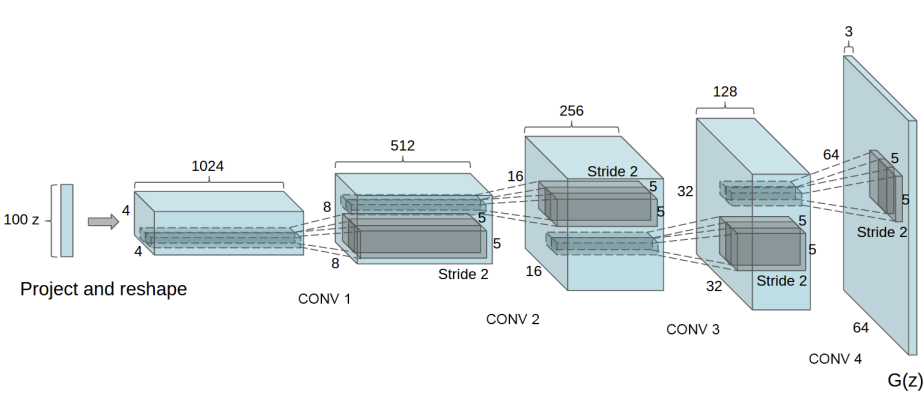

### Size of layers:
- ```nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride=1, padding=0, output_padding=0, bias=True)```
- Remember for Convolution -> $O = \frac{I+2P-(K-1)-1}{S} + 1$
- For Transpose Convolution -> $O = (I-1)S -2P + (K-1) + 1 $
- The following are the sizes input into each layer
1. Input -> (128, 100, 1, 1)  | Output -> (128, 512, 4, 4)  | Stride=1, inpad=0, kernel=4
     1. Ex -> (1-1)x1 - 0 + 4 -> (128x512x4x4)
2. Input -> (128, 512, 4, 4)  | Output -> (128, 256, 8, 8)  | Stride=2, inpad=1, kernel=4
     1. Ex -> (4-1)x2 - 2x1 + 4 = 8 -> (128x256x8x8)  
3. Input -> (128, 256, 8, 8)  | Output -> (128, 128,16,16)  | Stride=2, inpad=1, kernel=4
     1. Ex -> (8-1)x2-2x1+ 4 = 16 --> (128x128x16x16)
4. Input -> (128, 128,16,16)  | Output -> (128, 64, 32,32)  | Stride=2, inpad=1, kernel=4
     1. Ex -> (16-1)x2-2x1+4 = 32 -> (128x64x32x32) 
5. Input -> (128, 64, 32,32)  | Output -> (128, 3, 64, 64). | Stride=2, inpad=1, kernel 4
     1. Ex -> (32-1)x2-2+4 = 64 ->(128x3x64x64)

In [28]:
# Create generator architecture using conv transpose, batch norm, and relu to get to nz->3x64x64
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # Shape = (128, 100, 1, 1)
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # Shape = (128, 512, 4, 4)
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # Shape = (128, 256, 8, 8)
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # Shape=(128, 128, 16, 16)
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # Shape = (128, 64, 32, 32)
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # Shape = (128, 3, 64 64)
        )

    def forward(self, input):
        return self.main(input)

In [31]:
# Instantiate generator with ngpu's
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply our normal distribution weight initialization mean=0, std=0.02
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Discriminator:
1. "Strided" Convolution -> Used to both convolve layers AND downsample without pooling (so that NN will learn its own pooling)
2. LeakyReLU -> Used to prevent vanishing gradients and so that discriminator does not become too confident at the end.

### Shape:
1. (128,3,64,64) -> $O = \frac{I+2P-(K-1)-1}{S} + 1 = \frac{64+2-3-1}{2}+1=32$ -> (128,64,32,32)
2. (128,64,32,32)->$\frac{32+2-3-1}{2}+1=16$->(128,128,16,16)
3. (128,128,16,16)->$\frac{16+2-3-1}{2}+1=8$->(128,256,8,8)
4. (128,256,8,8)->$\frac{8+2-3-1}{2}+1=4$->(128,512,4,4)
4. (128,512,4,4)->$\frac{4+0-3-1}{2}+1=1$->(128,1,1,1)


In [32]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # Shape = (128,3,64,64)
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # Shape = (128,64,32,32)
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # Shape = (128,128,16,16)
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # Shape = (128, 256, 8, 8)
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # Shape = (128,512,4,4)
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # Shape = (128, 1, 1, 1)
        )

    def forward(self, input):
        return self.main(input)

In [33]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [34]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

### Steps to Train GAN
1. Discriminator:
    1. Minimize -log(G(x)) on real data: Favors large G(x) ~ real images are real
    2. Minimize -log(1-D(G(z)) on fake data: Favors small D(G(z)) ~ fake images are fake
2. Generator:
    1. Maximize -log(G(z)) on real data: Favores large G(z) ~ fake images are real

In [35]:
# Training Loop
import time
start_time = time.time()
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
#num_epochs = 1
for epoch in range(num_epochs):
    epoch_start_time = time.time()
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        iteration_start_time = time.time()
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # 1. Maximize G(x) on real data
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)

        # Calculate loss on all-real batch
        errD_real = criterion(output, label)

        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()
        
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)

        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(dataloader)}] '
                  f'Loss_D: {errD.item():.4f} '
                  f'Loss_G: {errG.item():.4f} '
                  f'D(x): {D_x:.4f} '
                  f'D(G(z))_Dfake: {D_G_z1:.4f} ' 
                  f'D(G(z))_Gfake: {D_G_z2:.4f}')

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
        iteration_end_time = time.time()
        #print(f'Iteration {i} Time = {(iteration_end_time-iteration_start_time):.4f} seconds')
    # Get the time for each epoch
    epoch_end_time = time.time()
    print(f'Epoch {epoch} Time = {(epoch_end_time-epoch_start_time):.4f} seconds')


Starting Training Loop...


/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[0/5][0/1457] Loss_D: 1.8263 Loss_G: 4.4218 D(x): 0.3891 D(G(z))_Dfake: 0.4573 D(G(z))_Gfake: 0.0143
[0/5][50/1457] Loss_D: 1.3459 Loss_G: 30.9090 D(x): 0.5266 D(G(z))_Dfake: 0.0000 D(G(z))_Gfake: 0.0000
[0/5][100/1457] Loss_D: 0.2473 Loss_G: 4.9941 D(x): 0.8655 D(G(z))_Dfake: 0.0576 D(G(z))_Gfake: 0.0119
[0/5][150/1457] Loss_D: 1.3683 Loss_G: 0.3765 D(x): 0.3128 D(G(z))_Dfake: 0.0090 D(G(z))_Gfake: 0.7241
[0/5][200/1457] Loss_D: 0.3423 Loss_G: 2.9582 D(x): 0.8710 D(G(z))_Dfake: 0.1657 D(G(z))_Gfake: 0.0716
[0/5][250/1457] Loss_D: 0.2302 Loss_G: 3.1378 D(x): 0.8254 D(G(z))_Dfake: 0.0177 D(G(z))_Gfake: 0.0692
[0/5][300/1457] Loss_D: 0.1282 Loss_G: 4.2124 D(x): 0.9180 D(G(z))_Dfake: 0.0363 D(G(z))_Gfake: 0.0211
[0/5][350/1457] Loss_D: 0.1399 Loss_G: 3.7265 D(x): 0.9337 D(G(z))_Dfake: 0.0484 D(G(z))_Gfake: 0.0287
[0/5][400/1457] Loss_D: 0.2898 Loss_G: 2.8802 D(x): 0.7890 D(G(z))_Dfake: 0.0150 D(G(z))_Gfake: 0.0972
[0/5][450/1457] Loss_D: 0.8554 Loss_G: 4.0626 D(x): 0.5660 D(G(z))_Dfake: 0

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[1/5][0/1457] Loss_D: 0.5688 Loss_G: 2.0596 D(x): 0.6545 D(G(z))_Dfake: 0.0767 D(G(z))_Gfake: 0.1616
[1/5][50/1457] Loss_D: 0.3972 Loss_G: 4.3193 D(x): 0.9262 D(G(z))_Dfake: 0.2428 D(G(z))_Gfake: 0.0186
[1/5][100/1457] Loss_D: 0.5598 Loss_G: 2.3777 D(x): 0.6684 D(G(z))_Dfake: 0.0755 D(G(z))_Gfake: 0.1615
[1/5][150/1457] Loss_D: 1.2547 Loss_G: 3.8485 D(x): 0.4597 D(G(z))_Dfake: 0.0180 D(G(z))_Gfake: 0.0400
[1/5][200/1457] Loss_D: 0.2689 Loss_G: 3.4868 D(x): 0.9178 D(G(z))_Dfake: 0.1506 D(G(z))_Gfake: 0.0433
[1/5][250/1457] Loss_D: 0.3337 Loss_G: 3.6896 D(x): 0.9340 D(G(z))_Dfake: 0.1929 D(G(z))_Gfake: 0.0413
[1/5][300/1457] Loss_D: 0.3132 Loss_G: 2.8849 D(x): 0.7927 D(G(z))_Dfake: 0.0426 D(G(z))_Gfake: 0.0894
[1/5][350/1457] Loss_D: 0.3258 Loss_G: 2.6805 D(x): 0.8490 D(G(z))_Dfake: 0.1001 D(G(z))_Gfake: 0.1014
[1/5][400/1457] Loss_D: 0.5946 Loss_G: 5.5656 D(x): 0.9388 D(G(z))_Dfake: 0.3572 D(G(z))_Gfake: 0.0069
[1/5][450/1457] Loss_D: 0.8426 Loss_G: 0.7051 D(x): 0.6009 D(G(z))_Dfake: 0.

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[2/5][0/1457] Loss_D: 1.6984 Loss_G: 8.7831 D(x): 0.9873 D(G(z))_Dfake: 0.7230 D(G(z))_Gfake: 0.0002


/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[2/5][50/1457] Loss_D: 0.4837 Loss_G: 2.3618 D(x): 0.7103 D(G(z))_Dfake: 0.0716 D(G(z))_Gfake: 0.1275
[2/5][100/1457] Loss_D: 0.2945 Loss_G: 3.9423 D(x): 0.8929 D(G(z))_Dfake: 0.1482 D(G(z))_Gfake: 0.0319
[2/5][150/1457] Loss_D: 1.5726 Loss_G: 1.7554 D(x): 0.3192 D(G(z))_Dfake: 0.0006 D(G(z))_Gfake: 0.4231
[2/5][200/1457] Loss_D: 0.2943 Loss_G: 2.8563 D(x): 0.9128 D(G(z))_Dfake: 0.1708 D(G(z))_Gfake: 0.0802
[2/5][250/1457] Loss_D: 0.9271 Loss_G: 6.2863 D(x): 0.9553 D(G(z))_Dfake: 0.5128 D(G(z))_Gfake: 0.0034
[2/5][300/1457] Loss_D: 0.3106 Loss_G: 2.9058 D(x): 0.9426 D(G(z))_Dfake: 0.1958 D(G(z))_Gfake: 0.0849
[2/5][350/1457] Loss_D: 0.3336 Loss_G: 3.8133 D(x): 0.8550 D(G(z))_Dfake: 0.1317 D(G(z))_Gfake: 0.0342
[2/5][400/1457] Loss_D: 0.2860 Loss_G: 3.1544 D(x): 0.8270 D(G(z))_Dfake: 0.0624 D(G(z))_Gfake: 0.0720
[2/5][450/1457] Loss_D: 0.2768 Loss_G: 4.6350 D(x): 0.8784 D(G(z))_Dfake: 0.1159 D(G(z))_Gfake: 0.0192
[2/5][500/1457] Loss_D: 0.3081 Loss_G: 3.0956 D(x): 0.8532 D(G(z))_Dfake: 

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[3/5][0/1457] Loss_D: 1.9899 Loss_G: 6.6794 D(x): 0.9983 D(G(z))_Dfake: 0.7868 D(G(z))_Gfake: 0.0029
[3/5][50/1457] Loss_D: 0.1932 Loss_G: 3.6509 D(x): 0.8728 D(G(z))_Dfake: 0.0431 D(G(z))_Gfake: 0.0468
[3/5][100/1457] Loss_D: 0.3552 Loss_G: 2.4966 D(x): 0.8691 D(G(z))_Dfake: 0.1522 D(G(z))_Gfake: 0.1228
[3/5][150/1457] Loss_D: 0.3312 Loss_G: 4.0920 D(x): 0.9188 D(G(z))_Dfake: 0.1926 D(G(z))_Gfake: 0.0241
[3/5][200/1457] Loss_D: 0.4885 Loss_G: 2.5470 D(x): 0.7535 D(G(z))_Dfake: 0.1356 D(G(z))_Gfake: 0.1096
[3/5][250/1457] Loss_D: 0.4410 Loss_G: 2.0164 D(x): 0.7499 D(G(z))_Dfake: 0.0751 D(G(z))_Gfake: 0.1823
[3/5][300/1457] Loss_D: 0.6919 Loss_G: 1.2197 D(x): 0.5828 D(G(z))_Dfake: 0.0460 D(G(z))_Gfake: 0.3868
[3/5][350/1457] Loss_D: 0.7259 Loss_G: 5.0836 D(x): 0.7805 D(G(z))_Dfake: 0.3135 D(G(z))_Gfake: 0.0108
[3/5][400/1457] Loss_D: 0.6155 Loss_G: 2.8742 D(x): 0.8253 D(G(z))_Dfake: 0.2872 D(G(z))_Gfake: 0.0771
[3/5][450/1457] Loss_D: 0.8796 Loss_G: 3.2751 D(x): 0.5448 D(G(z))_Dfake: 0.

/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[4/5][0/1457] Loss_D: 0.4257 Loss_G: 4.0772 D(x): 0.9583 D(G(z))_Dfake: 0.2771 D(G(z))_Gfake: 0.0299


/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


[4/5][50/1457] Loss_D: 0.4138 Loss_G: 2.8174 D(x): 0.8420 D(G(z))_Dfake: 0.1465 D(G(z))_Gfake: 0.1112
[4/5][100/1457] Loss_D: 0.3242 Loss_G: 3.3079 D(x): 0.8335 D(G(z))_Dfake: 0.1079 D(G(z))_Gfake: 0.0553
[4/5][150/1457] Loss_D: 0.3606 Loss_G: 3.3354 D(x): 0.8492 D(G(z))_Dfake: 0.1482 D(G(z))_Gfake: 0.0618
[4/5][200/1457] Loss_D: 0.7954 Loss_G: 3.5709 D(x): 0.5353 D(G(z))_Dfake: 0.0231 D(G(z))_Gfake: 0.0749
[4/5][250/1457] Loss_D: 0.8477 Loss_G: 2.1221 D(x): 0.4910 D(G(z))_Dfake: 0.0068 D(G(z))_Gfake: 0.1949
[4/5][300/1457] Loss_D: 0.1686 Loss_G: 4.3191 D(x): 0.9241 D(G(z))_Dfake: 0.0761 D(G(z))_Gfake: 0.0238
[4/5][350/1457] Loss_D: 0.2273 Loss_G: 3.3218 D(x): 0.8870 D(G(z))_Dfake: 0.0874 D(G(z))_Gfake: 0.0618
[4/5][400/1457] Loss_D: 1.3975 Loss_G: 5.8621 D(x): 0.8840 D(G(z))_Dfake: 0.6471 D(G(z))_Gfake: 0.0045
[4/5][450/1457] Loss_D: 0.6014 Loss_G: 1.0889 D(x): 0.6414 D(G(z))_Dfake: 0.0686 D(G(z))_Gfake: 0.4402
[4/5][500/1457] Loss_D: 0.3100 Loss_G: 4.0390 D(x): 0.9001 D(G(z))_Dfake: 

In [36]:
print(f'Num Batches = {len(dataloader)}')
print(f'Length of Batch = {len(next(iter(dataloader))[0])}')
print(f'Size of Dataset = {len(dataloader.dataset)}')

Num Batches = 1457


/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Length of Batch = 64
Size of Dataset = 93210


### Results and Evaluation
1. Plot the losses from generator and discriminator
2. Plot the images

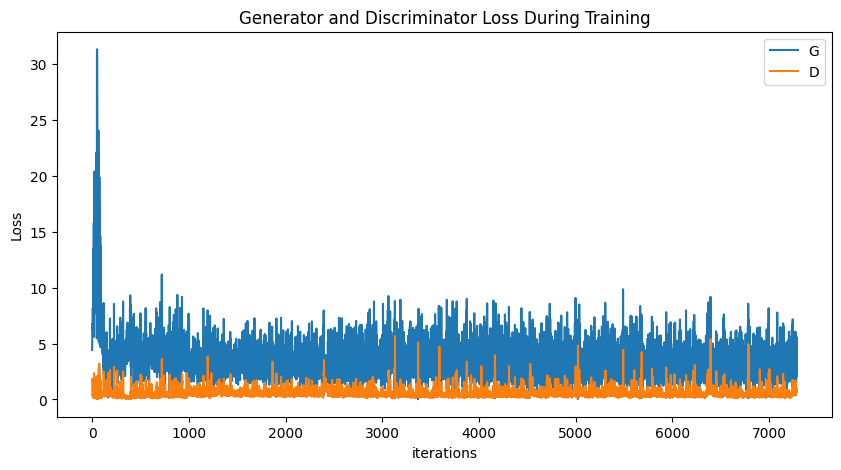

In [37]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

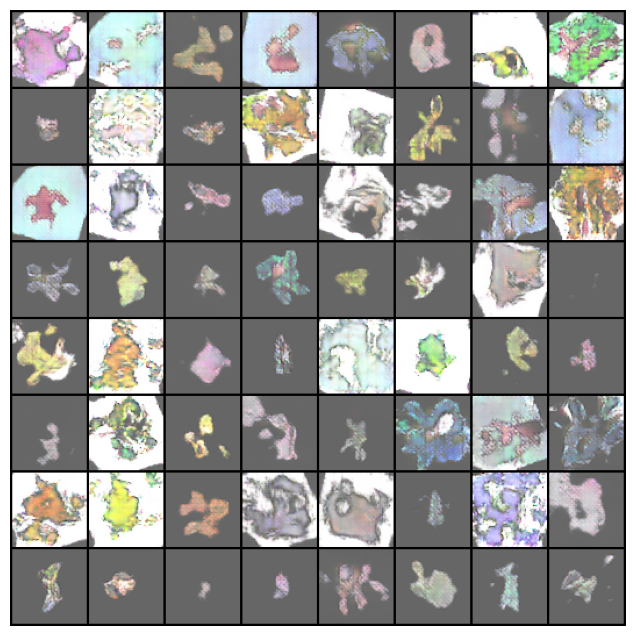

In [38]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())